In [34]:
from visual_behavior import utilities as vbu
import visual_behavior.plotting as vbp
from visual_behavior.utilities import EyeTrackingData
from visual_behavior import database as db
import pandas as pd
import matplotlib.pyplot as plt
import os
import numpy as np
import time
import seaborn as sns
import matplotlib.patches as patches

from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px

import matplotlib.cm as cm

from scipy import stats

from multiprocessing import Pool

from dro.modules import eye_tracking as et
from dro.modules import plotting as plot_utils

import chart_studio.tools as tls

import warnings
warnings.filterwarnings("ignore")

In [5]:
import plotly.io as pio
pio.renderers.default='notebook'

In [6]:
%matplotlib notebook
%widescreen

In [7]:
manifest = pd.read_csv('/allen/programs/braintv/workgroups/nc-ophys/Doug/2019.12.10.sessions_with_tracking.csv')
sessions_to_exclude = pd.read_csv('/allen/programs/braintv/workgroups/nc-ophys/visual_behavior/2019.12.10_eye_tracking_sessions_to_exclude.csv')
manifest = manifest[~manifest['ophys_session_id'].isin(sessions_to_exclude['sessions_to_exclude'].tolist())]

additional_sessions_to_exclude = [
    960475393, #mislabeled session name
]
manifest = manifest[~manifest['ophys_session_id'].isin(additional_sessions_to_exclude)]

In [ ]:
eye_dict = {}
pool = Pool(16)
osids = manifest['ophys_session_id'].unique()
ans = pool.map(et.open_eye_data,osids)
eye_dict = {d.ophys_session_id:d for d in ans if d is not None}

opening eye data for osid = 942114744
opening eye data for osid = 954961790
opening eye data for osid = 959454463
opening eye data for osid = 955991376
opening eye data for osid = 948042811
opening eye data for osid = 940775208
opening eye data for osid = 932664150
opening eye data for osid = 938359348
opening eye data for osid = 961226856
opening eye data for osid = 929255931
opening eye data for osid = 928142719
opening eye data for osid = 931687751
opening eye data for osid = 935859569
opening eye data for osid = 925478114
opening eye data for osid = 922743776
opening eye data for osid = 921922878
opening eye data for osid = 920317769
opening eye data for osid = 923704003
opening eye data for osid = 929688369
opening eye data for osid = 954981981
opening eye data for osid = 947199653
opening eye data for osid = 960593969
opening eye data for osid = 935559843
opening eye data for osid = 958931715
opening eye data for osid = 929255311
opening eye data for osid = 952434025
opening eye 

In [ ]:
eye_dict.keys()

dict_keys([961226856, 960593969, 959751299, 959454463, 958931715, 957189583, 955991376, 954981981, 954408500, 954961790, 952434025, 948090163, 948042811, 947199653, 943299247, 942114744, 941300832, 940446507, 940775208, 939524851, 939526443, 938359348, 938140092, 937162622, 935859569, 935559843, 933439847, 932664150, 932662051, 931564063, 931687751, 929688369, 929686773, 929255931, 929255311, 928146339, 928142719, 927721370, 927787876, 925478114, 923704003, 923202821, 922743776, 922511481, 922168593, 921922878, 920317769, 920695792, 919432737, 919888953, 918719819, 918718550, 919041767, 918889065, 917498735, 916650386, 915587736, 915306390, 914797752, 914728054, 914639324, 914161594, 913834848, 913564409, 911719666, 910971181, 910739829, 908441202, 907991198, 907177554, 906968227, 906521029, 906299056, 902777219, 902884228, 901759468, 900802327, 898295293, 894204946, 893937838, 892217026, 889918231, 889179793, 888940531, 888190799, 884359468, 880753403, 879897824, 878918807, 876557230,

In [ ]:
pool = Pool(16)
bd = pool.map(et.open_behavior_data,list(eye_dict.keys()))
behavior_dict = {d.ophys_session_id:d for d in bd if d is not None}

opening behavior data for osid = 961226856
opening behavior data for osid = 938359348
opening behavior data for osid = 959454463
opening behavior data for osid = 940775208
opening behavior data for osid = 954961790
opening behavior data for osid = 955991376
opening behavior data for osid = 932664150
opening behavior data for osid = 948042811
opening behavior data for osid = 928142719
opening behavior data for osid = 935859569
opening behavior data for osid = 942114744
opening behavior data for osid = 931687751
opening behavior data for osid = 922743776
opening behavior data for osid = 925478114
opening behavior data for osid = 929255931
opening behavior data for osid = 921922878
opening behavior data for osid = 952434025
opening behavior data for osid = 920317769
opening behavior data for osid = 929688369
opening behavior data for osid = 960593969
opening behavior data for osid = 932662051
opening behavior data for osid = 938140092
opening behavior data for osid = 954981981
opening beh

In [ ]:
valid_osids = list(behavior_dict.keys())
len(valid_osids)

160

In [ ]:
def get_first_stim(osid):
    print('getting first response for {}'.format(osid))
    first_pupil_responses,first_running_responses = et.get_individual_image_responses(eye_dict[osid],behavior_dict[osid],relative_to='first_presentations')
    data = {osid:{'pupil':first_pupil_responses,'running':first_running_responses}}
    return data
def get_last_stim(osid):
    print('getting last response for {}'.format(osid))
    last_pupil_responses,last_running_responses = et.get_individual_image_responses(eye_dict[osid],behavior_dict[osid],relative_to='last_presentations')
    data = {osid:{'pupil':last_pupil_responses,'running':last_running_responses}}
    return data

In [ ]:
pool = Pool(16)
first_response_list = pool.map(get_first_stim,list(valid_osids))
last_response_list = pool.map(get_last_stim,list(valid_osids))

getting first response for 959454463
getting first response for 961226856
getting first response for 954961790
getting first response for 931687751
getting first response for 938359348
getting first response for 955991376
getting first response for 948042811
getting first response for 940775208
getting first response for 942114744
getting first response for 935859569
getting first response for 928142719
getting first response for 929255931
getting first response for 925478114
getting first response for 921922878
getting first response for 922743776
getting first response for 932664150
getting first response for 929255311
getting first response for 929688369
getting first response for 923704003
getting first response for 927721370
getting first response for 935559843
getting first response for 929686773
getting first response for 952434025
getting first response for 947199653
getting first response for 939524851
getting first response for 923202821
getting first response for 960593969
g

getting last response for 879897824
getting last response for 916650386
getting last response for 873542787
getting last response for 860331718
getting last response for 914161594
getting last response for 911719666
getting last response for 918719819
getting last response for 884359468
getting last response for 902777219
getting last response for 914797752
getting last response for 855083235
getting last response for 906968227
getting last response for 908441202
getting last response for 893937838
getting last response for 900802327
getting last response for 915587736
getting last response for 863981645
getting last response for 880753403
getting last response for 889179793
getting last response for 910971181
getting last response for 902884228
getting last response for 878918807
getting last response for 898295293
getting last response for 892217026
getting last response for 907991198
getting last response for 850959798
getting last response for 913834848
getting last response for 85

In [17]:
response_dict = {}
# for respo
for condition,response_list in zip(['first','last'],[first_response_list,last_response_list]):
    response_dict[condition] = {}
    for response in response_list:
        osid = list(response.keys())[0]
        response_dict[condition][osid] = response[osid]


In [18]:
response_dfs = {
    'pupil':{'first':pd.DataFrame(),'last':pd.DataFrame()},
    'running':{'first':pd.DataFrame(),'last':pd.DataFrame()},
}
# iterate over response types (first = onset of stimulus, last = offset of stimulus)
for response_type in ['pupil','running']:
    for condition in ['first','last']:
        # iterate over every session id
        for osid in response_dict[condition].keys():
            # get mean response for each image ID, save to a dataframe with columns formatted as {IMAGE_ID}_{OSID}
            for image_id in response_dict[condition][osid][response_type].keys():
                df = response_dict[condition][osid][response_type][image_id]
                if len(response_dfs[response_type][condition]) == 0:
                    response_dfs[response_type][condition]['time'] = df['time']
                columns = [c for c in df.columns if c!='time']
                response_dfs[response_type][condition]['{}_osid={}'.format(image_id,osid)] = df[columns].mean(axis=1)

In [19]:
image_ids = np.sort(np.unique(np.array([c.split('_')[0] for c in response_dfs['pupil']['first'].columns if c.startswith('im')])))
image_ids

array(['im000', 'im031', 'im035', 'im045', 'im054', 'im061', 'im062',
       'im063', 'im065', 'im066', 'im069', 'im073', 'im075', 'im077',
       'im085', 'im106'], dtype='<U5')

In [20]:
response_dfs['pupil']['first'].head()

,time,im061_osid=961226856,im062_osid=961226856,im063_osid=961226856,im065_osid=961226856,im066_osid=961226856,im069_osid=961226856,im077_osid=961226856,im085_osid=961226856,im061_osid=960593969,im062_osid=960593969,im063_osid=960593969,im065_osid=960593969,im066_osid=960593969,im069_osid=960593969,im077_osid=960593969,im085_osid=960593969,im061_osid=959751299,im062_osid=959751299,im063_osid=959751299,im065_osid=959751299,im066_osid=959751299,im069_osid=959751299,im077_osid=959751299,im085_osid=959751299,im000_osid=959454463,im031_osid=959454463,im035_osid=959454463,im045_osid=959454463,im054_osid=959454463,im073_osid=959454463,im075_osid=959454463,im106_osid=959454463,im061_osid=958931715,im062_osid=958931715,im063_osid=958931715,im065_osid=958931715,im066_osid=958931715,im069_osid=958931715,im077_osid=958931715,im085_osid=958931715,im000_osid=957189583,im031_osid=957189583,im035_osid=957189583,im045_osid=957189583,im054_osid=957189583,im073_osid=957189583,im075_osid=957189583,im106_osid=957189583,im000_osid=955991376,im031_osid=955991376,im035_osid=955991376,im045_osid=955991376,im054_osid=955991376,im073_osid=955991376,im075_osid=955991376,im106_osid=955991376,im000_osid=954981981,im031_osid=954981981,im035_osid=954981981,im045_osid=954981981,im054_osid=954981981,im073_osid=954981981,im075_osid=954981981,im106_osid=954981981,im000_osid=954408500,im031_osid=954408500,im035_osid=954408500,im045_osid=954408500,im054_osid=954408500,im073_osid=954408500,im075_osid=954408500,im106_osid=954408500,im000_osid=954961790,im031_osid=954961790,im035_osid=954961790,im045_osid=954961790,im054_osid=954961790,im073_osid=954961790,im075_osid=954961790,im106_osid=954961790,im000_osid=952434025,im031_osid=952434025,im035_osid=952434025,im045_osid=952434025,im054_osid=952434025,im073_osid=952434025,im075_osid=952434025,im106_osid=952434025,im061_osid=948090163,im062_osid=948090163,im063_osid=948090163,im065_osid=948090163,im066_osid=948090163,im069_osid=948090163,im077_osid=948090163,im085_osid=948090163,im000_osid=948042811,im031_osid=948042811,im035_osid=948042811,im045_osid=948042811,im054_osid=948042811,im073_osid=948042811,im075_osid=948042811,im106_osid=948042811,im061_osid=947199653,im062_osid=947199653,im063_osid=947199653,im065_osid=947199653,im066_osid=947199653,im069_osid=947199653,im077_osid=947199653,im085_osid=947199653,im000_osid=943299247,im031_osid=943299247,im035_osid=943299247,im045_osid=943299247,im054_osid=943299247,im073_osid=943299247,im075_osid=943299247,im106_osid=943299247,im000_osid=942114744,im031_osid=942114744,im035_osid=942114744,im045_osid=942114744,im054_osid=942114744,im073_osid=942114744,im075_osid=942114744,im106_osid=942114744,im000_osid=941300832,im031_osid=941300832,im035_osid=941300832,im045_osid=941300832,im054_osid=941300832,im073_osid=941300832,im075_osid=941300832,im106_osid=941300832,im061_osid=940446507,im062_osid=940446507,im063_osid=940446507,im065_osid=940446507,im066_osid=940446507,im069_osid=940446507,im077_osid=940446507,im085_osid=940446507,im061_osid=940775208,im062_osid=940775208,im063_osid=940775208,im065_osid=940775208,im066_osid=940775208,im069_osid=940775208,im077_osid=940775208,im085_osid=940775208,im061_osid=939524851,im062_osid=939524851,im063_osid=939524851,im065_osid=939524851,im066_osid=939524851,im069_osid=939524851,im077_osid=939524851,im085_osid=939524851,im000_osid=939526443,im031_osid=939526443,im035_osid=939526443,im045_osid=939526443,im054_osid=939526443,im073_osid=939526443,im075_osid=939526443,im106_osid=939526443,im061_osid=938359348,im062_osid=938359348,im063_osid=938359348,im065_osid=938359348,im066_osid=938359348,im069_osid=938359348,im077_osid=938359348,im085_osid=938359348,im061_osid=938140092,im062_osid=938140092,im063_osid=938140092,im065_osid=938140092,im066_osid=938140092,im069_osid=938140092,im077_osid=938140092,im085_osid=938140092,im061_osid=937162622,im062_osid=937162622,im063_osid=937162622,im065_osid=937162622,im066_osid=937162622,im069_osid=937162622,im07

In [65]:
names = [df_col.split('_')[1] for df_col in response_dfs['pupil']['first'].columns if df_col != 'time']
palette = sns.color_palette('rainbow', len(names))
colormap = {image:palette[i] for i,image in enumerate(sorted(names))}

for image_id in image_ids:
    print('image ID = {}'.format(image_id))
    subplot_titles = [
        'pupil response to {} onset'.format(image_id),
        'pupil response to {} offset'.format(image_id),
        'running response to {} onset'.format(image_id),
        'running response to {} offset'.format(image_id),
    ]
    fig = make_subplots(rows=2, cols=2, shared_xaxes=True, shared_yaxes=False,subplot_titles=subplot_titles)

    plotnumber = 0
    for row, response_type in enumerate(['pupil','running']):
        for col, condition in enumerate(['first','last']):
            plotnumber += 1
            df = response_dfs[response_type][condition]

            if row == 0 and col == 0:
                add_to_legend = True
            else:
                add_to_legend = False
            df_cols = [c for c in df.columns if c.startswith(image_id)]
            for df_col in df_cols:
                name = df_col.split('_')[1]
                color = 'rgb({},{},{})'.format(*[int(round(255*v)) for v in colormap[name]]) #color in plotly's ridiculous format
                fig.add_trace(
                    go.Scatter(
                        x = df['time'],
                        y = df[df_col],
                        opacity=0.50,
                        showlegend=add_to_legend,
                        name='{}'.format(name),
                    ),
                    row=row+1, 
                    col=col+1,
                )
            fig.add_trace(
                go.Scatter(
                    x = df['time'],
                    y = df[df_cols].mean(axis=1),
                    opacity=1,
                    line = {'width':4,'color':'black'},
                    showlegend=add_to_legend,
                    name='grand average',
                ),
                row=row+1, 
                col=col+1,
            )
            if condition == 'first':
                plot_utils.designate_flashes_plotly(fig,omit=None,pre_color='gray',post_color='blue', plotnumbers=[plotnumber] ,lims=[-100,100], alpha=0.4)
            elif condition == 'last':
                plot_utils.designate_flashes_plotly(fig,omit=None,pre_color='blue',post_color='gray', plotnumbers=[plotnumber] ,lims=[-6,6], alpha=0.4)
            
            if response_type == 'pupil':
                fig.update_yaxes(title_text="fraction change\nin pupil area", range=[-0.15,0.15], row=row+1, col=col+1)
            elif response_type == 'running':
                fig.update_yaxes(title_text="running speed (cm/s)", range=[-5,60], row=row+1, col=col+1)
                
            fig.update_xaxes(range=[-5,5], row=row+1, col=col+1)
            fig.update_xaxes(title_text="time from first stimulus presentation (s)", row=row+1, col=col+1)

    fig.update_layout(
        title="Responses to {}\n(blue = image {}, gray = average over all other images in set)".format(image_id, image_id),
    )
    fig.write_html("/home/dougo/code/dougollerenshaw.github.io/figures_to_share/2020.01.15_pupil_running_responses_by_image/2020.01.15_responses_to_image_{}.html".format(image_id))


image ID = im000
image ID = im031
image ID = im035
image ID = im045
image ID = im054
image ID = im061
image ID = im062
image ID = im063
image ID = im065
image ID = im066
image ID = im069
image ID = im073
image ID = im075
image ID = im077
image ID = im085
image ID = im106


In [66]:
df_grand_averages = {
    'pupil':{'first':pd.DataFrame(),'last':pd.DataFrame()},
    'running':{'first':pd.DataFrame(),'last':pd.DataFrame()},
}

for image_id in image_ids:
    for row, response_type in enumerate(['pupil','running']):
        for col, condition in enumerate(['first','last']):
            plotnumber += 1
            
            df = response_dfs[response_type][condition]

            df_cols = [c for c in df.columns if c.startswith(image_id)]
            
            if len(df_grand_averages[response_type][condition]) == 0:
                df_grand_averages[response_type][condition]['time'] = df['time']
                
            df_grand_averages[response_type][condition][image_id] = df[df_cols].mean(axis=1)

In [67]:
image_set_A = [
    'im077',
    'im066',
    'im063',
    'im062',
    'im061',
    'im065',
    'im085',
    'im069',
]
image_set_B = [im for im in image_ids if im not in image_set_A]

In [68]:
sorted(image_set_B)

['im000', 'im031', 'im035', 'im045', 'im054', 'im073', 'im075', 'im106']

In [69]:
subplot_titles = [
    'pupil response to image onset',
    'pupil response to image offset',
    'running response to image onset',
    'running response to image offset',
] 

palette = sns.color_palette('rainbow', 16)
colormap = {image:palette[i] for i,image in enumerate(sorted(image_set_A + image_set_B))}

# for image_set,image_set_name in zip([image_ids,image_set_B],['all','image set B']):
for image_set,image_set_name in zip([image_ids,image_set_A,image_set_B],['all','image set A','image set B']):
    fig = make_subplots(rows=2, cols=2, shared_xaxes=True, shared_yaxes=False,subplot_titles=subplot_titles)

    plotnumber = 0
    for row, response_type in enumerate(['pupil','running']):
        for col, condition in enumerate(['first','last']):
            plotnumber += 1
            df = df_grand_averages[response_type][condition]

            if row == 0 and col == 0:
                add_to_legend = True
            else:
                add_to_legend = False

            df_cols = [c for c in df.columns if c in image_set]
            for df_col in df_cols:
                color = 'rgb({},{},{})'.format(*[int(round(255*v)) for v in colormap[df_col]]) #color in plotly's ridiculous format
                fig.add_trace(
                    go.Scatter(
                        x = df['time'],
                        y = df[df_col],
                        opacity=0.6,
                        line = {'width':3,'color':color},
                        showlegend=add_to_legend,
                        name=df_col,
                    ),
                    row=row+1, 
                    col=col+1,
                )
            fig.add_trace(
                go.Scatter(
                    x = df['time'],
                    y = df[df_cols].mean(axis=1),
                    opacity=1,
                    line = {'width':4,'color':'black'},
                    showlegend=add_to_legend,
                    name='grand average',
                ),
                row=row+1, 
                col=col+1,
            )
            if condition == 'first':
                plot_utils.designate_flashes_plotly(fig,omit=None,pre_color='gray',post_color='blue', plotnumbers=[plotnumber] ,lims=[-100,100], alpha=0.4)
            elif condition == 'last':
                plot_utils.designate_flashes_plotly(fig,omit=None,pre_color='blue',post_color='gray', plotnumbers=[plotnumber] ,lims=[-6,6], alpha=0.4)

            if response_type == 'pupil':
                fig.update_yaxes(title_text="fraction change\nin pupil area", range=[-0.05,0.05], row=row+1, col=col+1)
            elif response_type == 'running':
                fig.update_yaxes(title_text="running speed (cm/s)", range=[0,25], row=row+1, col=col+1)

            fig.update_xaxes(range=[-5,5], row=row+1, col=col+1)
            fig.update_xaxes(title_text="time from first stimulus presentation (s)", row=row+1, col=col+1)

    fig.update_layout(
        title="Responses to {}, averaged across sessions\n(blue = individual image, gray = average over all other images in set)".format(image_set_name),
    )
    fig.write_html("/home/dougo/code/dougollerenshaw.github.io/figures_to_share/2020.01.15_pupil_running_responses_by_image/2020.01.15_responses_averaged_across_sessions_{}.html".format(image_set_name.replace(' ','_')))
    fig.show()

<IPython.core.display.Javascript object>


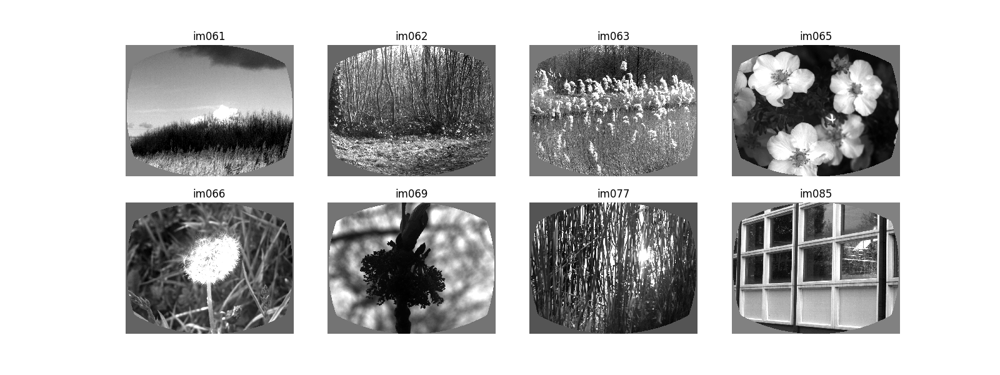

In [80]:
image_set_a = pd.read_pickle('//allen/programs/braintv/workgroups/nc-ophys/visual_behavior/image_dictionaries/Natural_Images_Lum_Matched_set_training_2017.07.14.pkl')

fig,ax=plt.subplots(2,4,figsize=(16,6))
for ii,image in enumerate(sorted(image_set_a.keys())):
    ax.flatten()[ii].imshow(image_set_a[image][image], cmap='gray')
    ax.flatten()[ii].axis('off')
    ax.flatten()[ii].set_title(image)

<IPython.core.display.Javascript object>


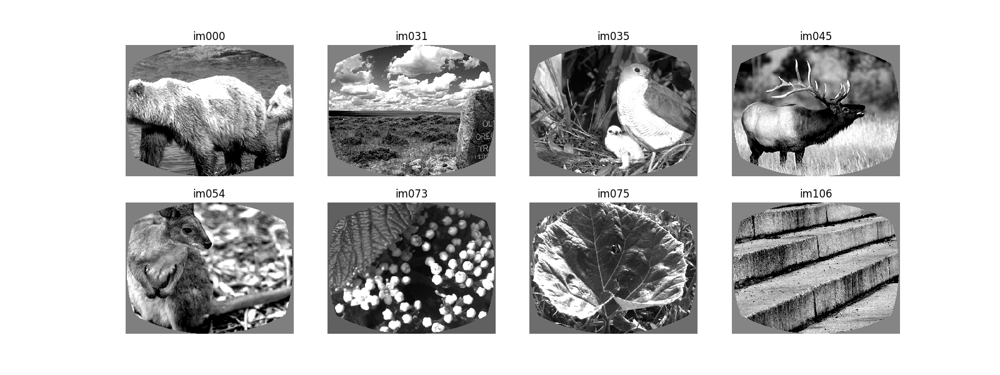

In [83]:
image_set_b = pd.read_pickle('//allen/programs/braintv/workgroups/nc-ophys/visual_behavior/image_dictionaries/Natural_Images_Lum_Matched_set_ophys_6_2017.07.14.pkl')

fig,ax=plt.subplots(2,4,figsize=(16,6))
for ii,image in enumerate(sorted(image_set_b.keys())):
    ax.flatten()[ii].imshow(image_set_b[image][image], cmap='gray')
    ax.flatten()[ii].axis('off')
    ax.flatten()[ii].set_title(image)